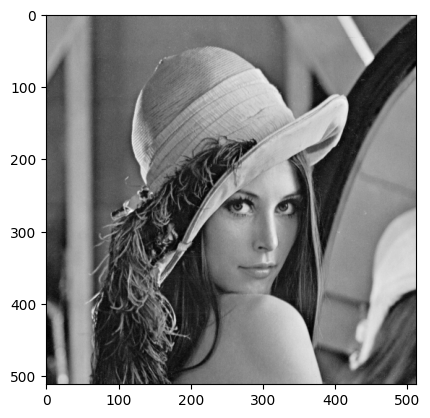

In [41]:
# Assignment 6 
# Author : Anirudh Sathish 
# Roll No : CS20B1125 

# importing nececsary libaries 
import cv2
import numpy as np 
import matplotlib.pyplot as plt 
import random 

# read the image 
lena_img = cv2.imread('Lena.png')

# convert lena to greyscale 
lena_gray = cv2.cvtColor(lena_img,cv2.COLOR_BGR2GRAY)
plt.imshow(lena_gray,cmap='gray')
#plt.show()


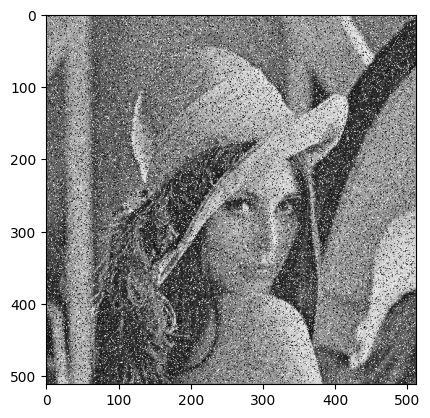

In [33]:
# add salt and pepper noises to the image with noise quantities from 0.1 to 1 , gnerating  10 images 

# function for salt and pepper nosie 
def saltAndPepper(img,noiseQuantity):
        # create an ooutput copy 
        resultant = np.copy(img)

        # deciding the salt pixels 
        num_salt = np.ceil(noiseQuantity* 0.5*img.size)
        salt_positions = [np.random.randint(0, i - 1, int(num_salt)) for i in img.shape]
        # applying salt noise 
        resultant[tuple(salt_positions)] = 255

        # Pepper noise
        num_pepper = np.ceil(noiseQuantity* img.size * 0.5)
        pepper_positions = [np.random.randint(0, i - 1, int(num_pepper)) for i in img.shape]
        resultant[tuple(pepper_positions)] = 0
        # return the resultant image 
        return resultant 

# test out the noise 
noisy_im = saltAndPepper(lena_gray,0.2)
plt.imshow(noisy_im,cmap = 'gray')
#plt.show()


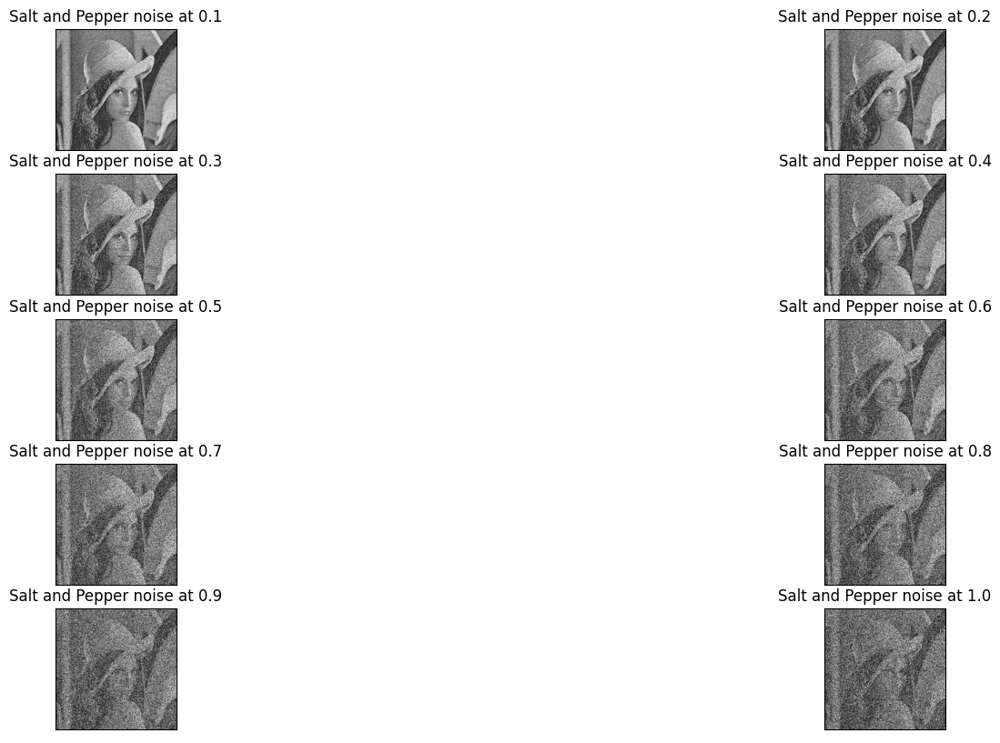

<Figure size 640x480 with 0 Axes>

In [34]:
#let us generate subplots for all noise images 
noisy_levels = [ x/10 for x in range(1,11)]

# for the above noise levels let us generate images and put it up on a subplot 
plt.figure(figsize = (20,10))

# loop through to generate all noisy images 
imageList = []  
for i in range(len(noisy_levels)):
        noisy_img = saltAndPepper(lena_gray,noisy_levels[i])
        imageList.append(noisy_img)

# now display all the images in a subplot 
for i in range(len(imageList)): 
        plt.subplot(5,2,i+1)
        plt.imshow(imageList[i],cmap = 'gray')
        title = "Salt and Pepper noise at " + str(noisy_levels[i])
        plt.title(title)
        plt.xticks([]), plt.yticks([])
# display the subplots 
plt.show()

# clear the plot 
plt.clf()




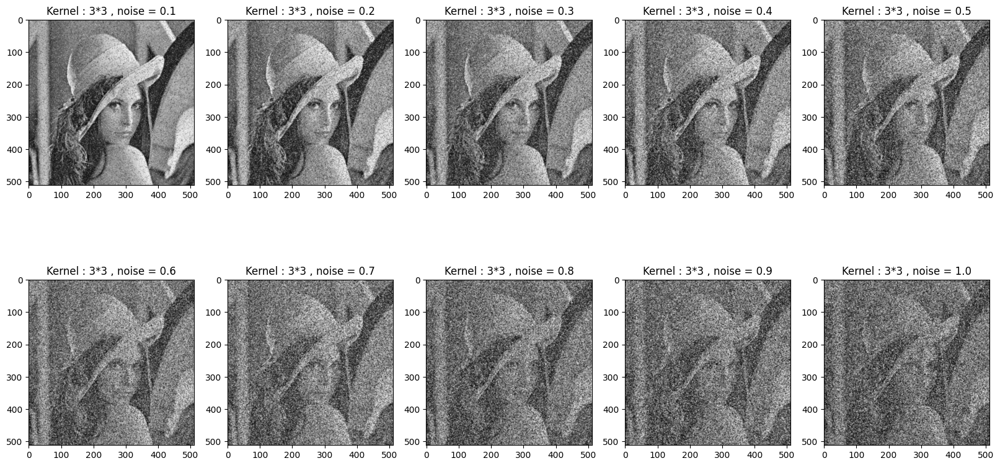

<Figure size 640x480 with 0 Axes>

In [42]:
# Also do the same using  lib functions 

# create gaussian filters with variance = 1 , and sizes 3*3 , 5*5 , 7*7 
variance = 1

# lets create the required filter sizes 
kdims = [3,5,7]

# lets create the required filters 
gaussianKernels = []
for i in range(len(kdims)):
        kernel = cv2.getGaussianKernel(kdims[i],variance)
        gaussian_kernel = np.outer(kernel,kernel.transpose())
        gaussianKernels.append(gaussian_kernel)

#Applying the 3*3 gaussian filter on all noisy images , using built in function 
# -> performing correlation 
plt.figure(figsize= (20,10))
for i in range(len(imageList)):
        gaussian = cv2.filter2D(imageList[i],-1,gaussianKernels[0])
        plt.subplot(2,5,i+1)
        title = "Kernel : 3*3 , noise = " + str(noisy_levels[i])
        plt.title(title)
        plt.imshow(gaussian,cmap = 'gray')
plt.show()
plt.clf()



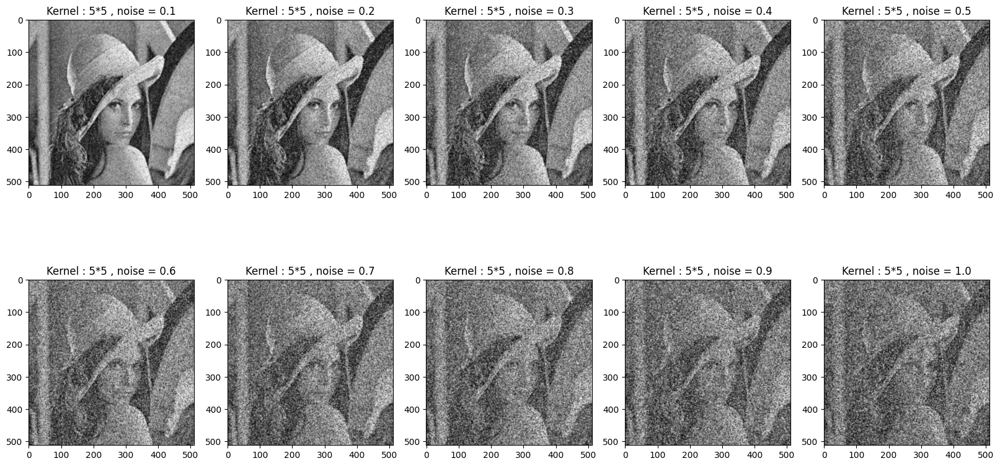

<Figure size 640x480 with 0 Axes>

In [45]:
# for 5*5 
plt.figure(figsize= (20,10))
for i in range(len(imageList)):
        gaussian = cv2.filter2D(imageList[i],-1,gaussianKernels[1])
        plt.subplot(2,5,i+1)
        title = "Kernel : 5*5 , noise = " + str(noisy_levels[i])
        plt.title(title)
        plt.imshow(gaussian,cmap = 'gray')
plt.show()

plt.clf()



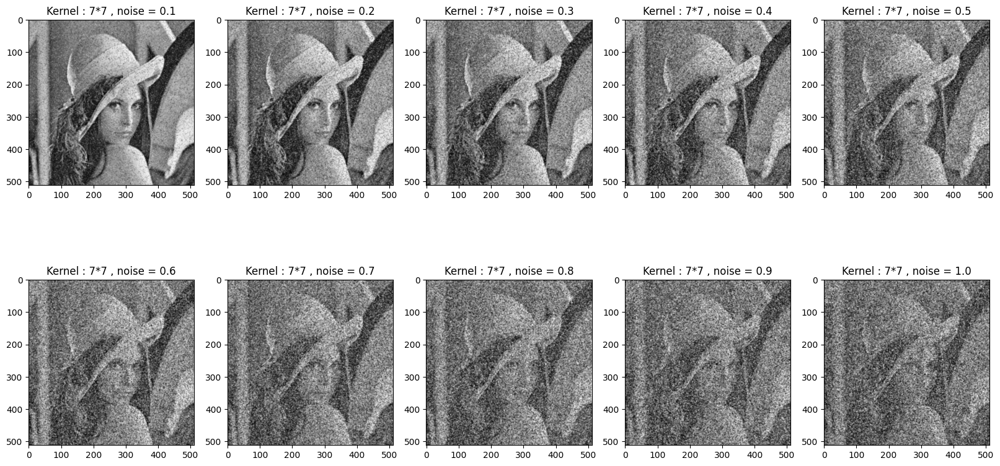

In [46]:
# for 7*7 
plt.figure(figsize= (20,10))
for i in range(len(imageList)):
        gaussian = cv2.filter2D(imageList[i],-1,gaussianKernels[2])
        plt.subplot(2,5,i+1)
        title = "Kernel : 7*7 , noise = " + str(noisy_levels[i])
        plt.title(title)
        plt.imshow(gaussian,cmap = 'gray')
plt.show()

In [47]:
def correlation(img, kernel):
    # Get image shape
    img_rows, img_cols = img.shape

    # Get kernel shape
    kernel_rows, kernel_cols = kernel.shape

    # Calculate kernel offset
    kernel_offset_rows = kernel_rows // 2
    kernel_offset_cols = kernel_cols // 2

    # Calculate padding size
    pad_rows = kernel_offset_rows
    pad_cols = kernel_offset_cols

    # Pad the image with zeros
    padded_img = np.pad(img, ((pad_rows, pad_rows), (pad_cols, pad_cols)), 'constant', constant_values=0)

    # Initialize output image with zeros
    out_img = np.zeros_like(img)

    # Loop over all pixels in the original image
    for row in range(kernel_offset_rows, img_rows + kernel_offset_rows):
        for col in range(kernel_offset_cols, img_cols + kernel_offset_cols):
            # Extract the region of interest (ROI) from the padded image
            roi = padded_img[row - kernel_offset_rows:row + kernel_offset_rows + 1, col - kernel_offset_cols:col + kernel_offset_cols + 1]

            # Apply the kernel to the ROI using element-wise multiplication and sum the results
            out_pixel = np.sum(roi * kernel)

            # Set the output pixel to the computed value
            out_img[row - kernel_offset_rows, col - kernel_offset_cols] = out_pixel

    return out_img


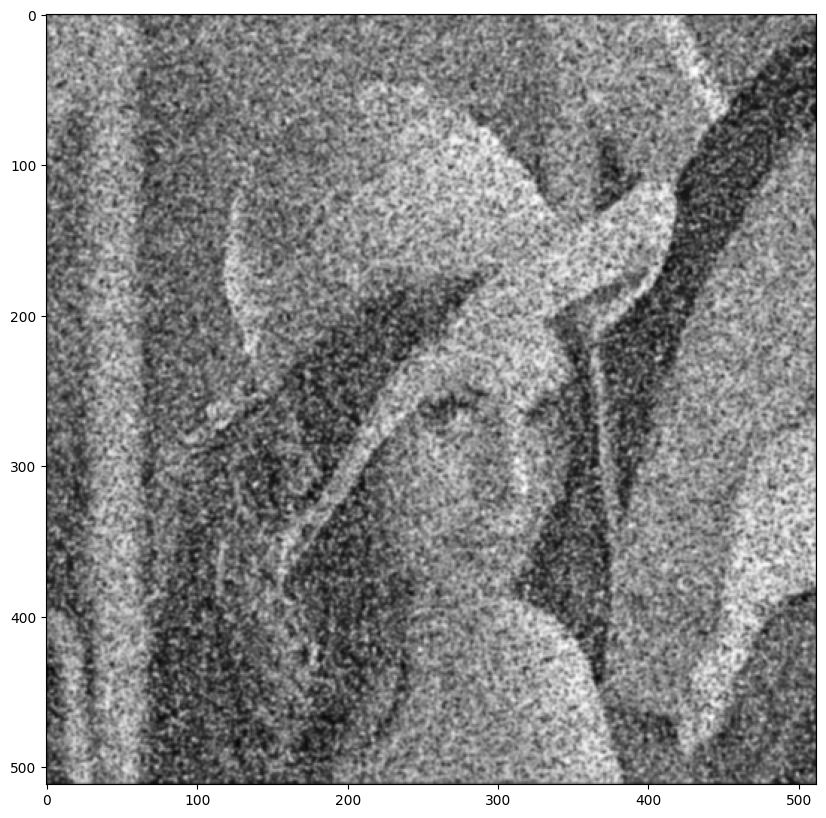

In [48]:
#plt.imshow(imageList[1],cmap = 'gray')
#plt.clf()
plt.figure(figsize = (20,10))
corr_img = correlation(imageList[4],gaussianKernels[2])
plt.imshow(corr_img,cmap = 'gray')
plt.show()

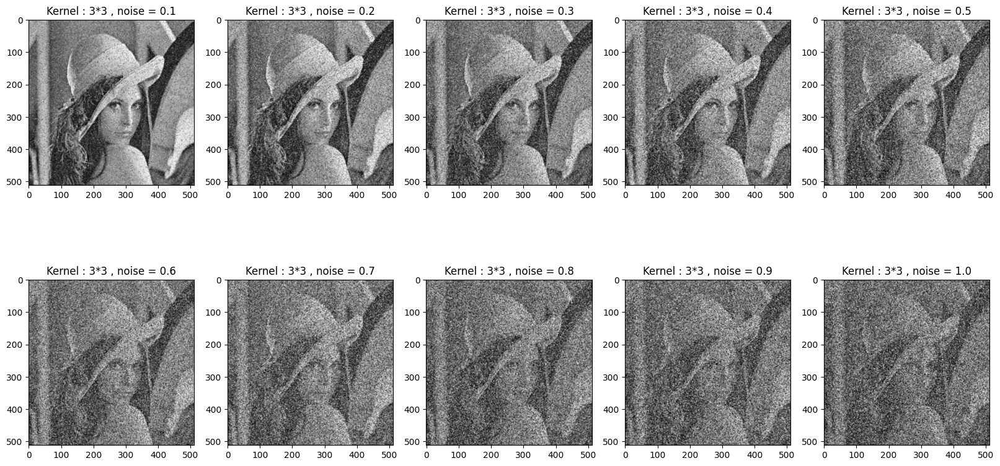

<Figure size 640x480 with 0 Axes>

In [49]:

#Applying the 3*3 gaussian filter on all noisy images , using user defined function 
# -> performing correlation 
plt.figure(figsize= (20,10))
for i in range(len(imageList)):
        gaussian = correlation(imageList[i],gaussianKernels[0])
        plt.subplot(2,5,i+1)
        title = "Kernel : 3*3 , noise = " + str(noisy_levels[i])
        plt.title(title)
        plt.imshow(gaussian,cmap = 'gray')
plt.show()
plt.clf()


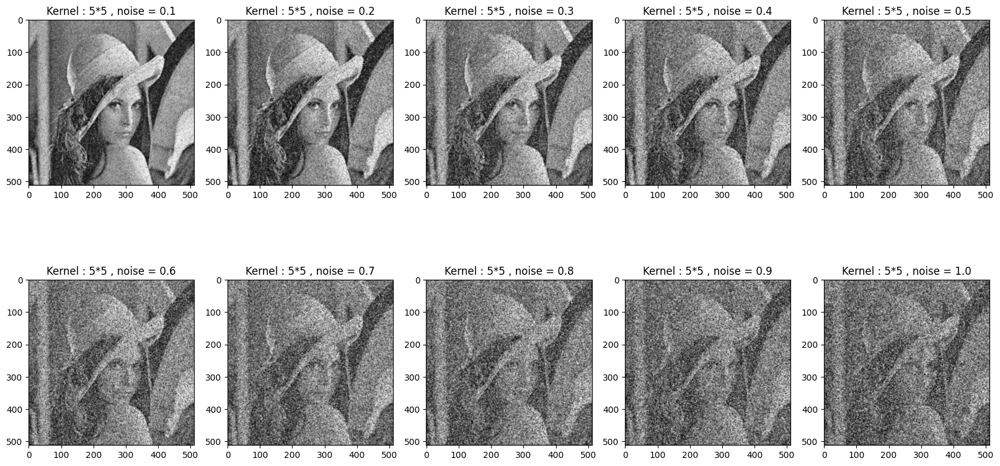

<Figure size 640x480 with 0 Axes>

In [52]:

# for 5*5 
plt.figure(figsize= (20,10))
for i in range(len(imageList)):
        gaussian = correlation(imageList[i],gaussianKernels[1])
        plt.subplot(2,5,i+1)
        title = "Kernel : 5*5 , noise = " + str(noisy_levels[i])
        plt.title(title)
        plt.imshow(gaussian,cmap = 'gray')
plt.show()

plt.clf()


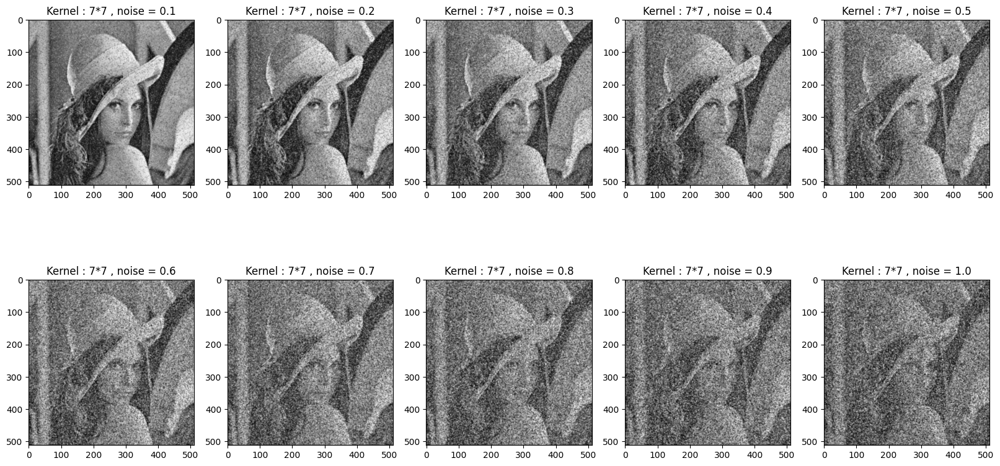

In [51]:
# for 7*7 
plt.figure(figsize= (20,10))
for i in range(len(imageList)):
        gaussian = correlation(imageList[i],gaussianKernels[2])
        plt.subplot(2,5,i+1)
        title = "Kernel : 7*7 , noise = " + str(noisy_levels[i])
        plt.title(title)
        plt.imshow(gaussian,cmap = 'gray')
plt.show()